# Udacity Self-Driving Car Nanodegree

## Advanced-Lane-finding Project

The goals of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Apply a perspective transform to rectify undistorted image ("birds-eye view").
4. Use color transforms, gradients, etc., to create a thresholded binary image.
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Importing relevant modules

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import glob
import pickle

### Step 1: Computing camera calibration parameters and distortion coefficients

In [2]:
### Corner detection in calibration image & camera calibration

def calibration_params(img_dirs, nx, ny, ret_img_pts=False):
    """
    Computation of camera matrix, distortion coefficients from a set of calibration images
    Note: Parameters (nx, ny) represent number of interior corners along 
    x, y direction in calibration (chessboard) image
    
    """
    # Creating lists for storing collections of object points (3D) and image points (2D) for all calibration images
    obj_pts = []    # List for storing 3D world coordinates of object in real world space
    img_pts = []    # List for storing 2D image coordinates of the object in image plane

    # Generate object points for image (remains constant across images)
    obj_p = np.zeros((nx * ny, 3), np.float32)
    obj_p[:, :2] =  np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)    # x, y coordinates

    # Calibration points from images
    for fname in img_dirs:
        img = mpimg.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)    # Grayscale image

        # Detect Chessboard corners & set 'ret' flag depending on whether the function is able to find the corners or not
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        
        # Appends detected object points (corners) & image points to their corresponding lists if corners found in image
        if ret:
            obj_pts.append(obj_p)
            img_pts.append(corners)
        else:
            print('Corners not detected in image {}'.format(fname.split('\\')[-1]))
            
    # Calibration parameters calculation
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_pts, img_pts, img.shape[1::-1], None, None)
    
    if ret_img_pts:
        return mtx, dist, img_pts
    return mtx, dist


def undistort_img(img, mtx, dist):
    """
    Undistorting image using pre-computed camera calibration parameters
    """
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist


def draw_on_img(img, nx, ny, corners, ret=True):
    """
    Drawing detected corners onto sample image
    """
    img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)      # Drawing corners on sample image
    return img

#### Visualizing corner detection in calibration images

Corners not detected in image calibration01.jpg
Corners not detected in image calibration04.jpg
Corners not detected in image calibration05.jpg


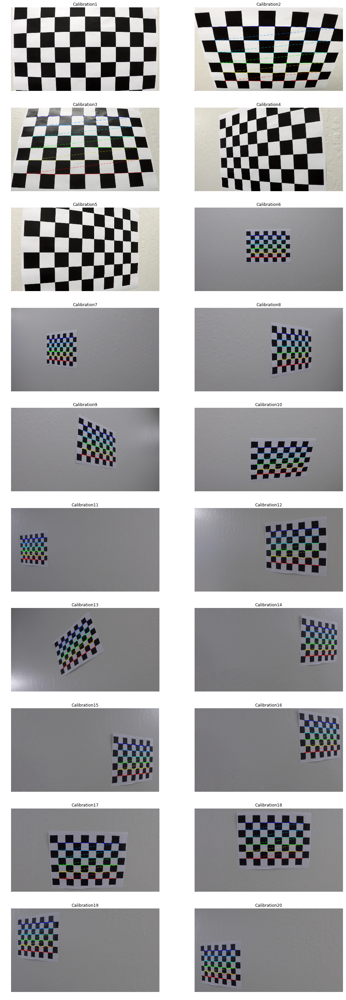

In [3]:
### Visualizing the calibration images with corners drawn on image
%matplotlib inline

# Specifying interior corner dimensions for calibration image
(n_x, n_y) = (9, 6)

# Extracting names of all calibration images and storing them to a list
img_names = glob.glob('.\camera_cal\calibration*.jpg')

camera_mat, dist_coeff, imgpts = calibration_params(img_names, n_x, n_y, ret_img_pts=True)

fig, axs = plt.subplots(len(img_names)//2, 2, figsize=(18, 54))
axs = axs.ravel()

for i in range(len(img_names)):
    image = mpimg.imread(img_names[i])
    if i not in (0, 3, 4):
        if i in (1,2): j=i-1
        else: j=i-3 
        image = draw_on_img(image, n_x, n_y, imgpts[j])
    axs[i].imshow(image)
    axs[i].set_title('Calibration'+str(i+1))
    axs[i].axis('off')
plt.show()

### Step 2: Applying distortion correction

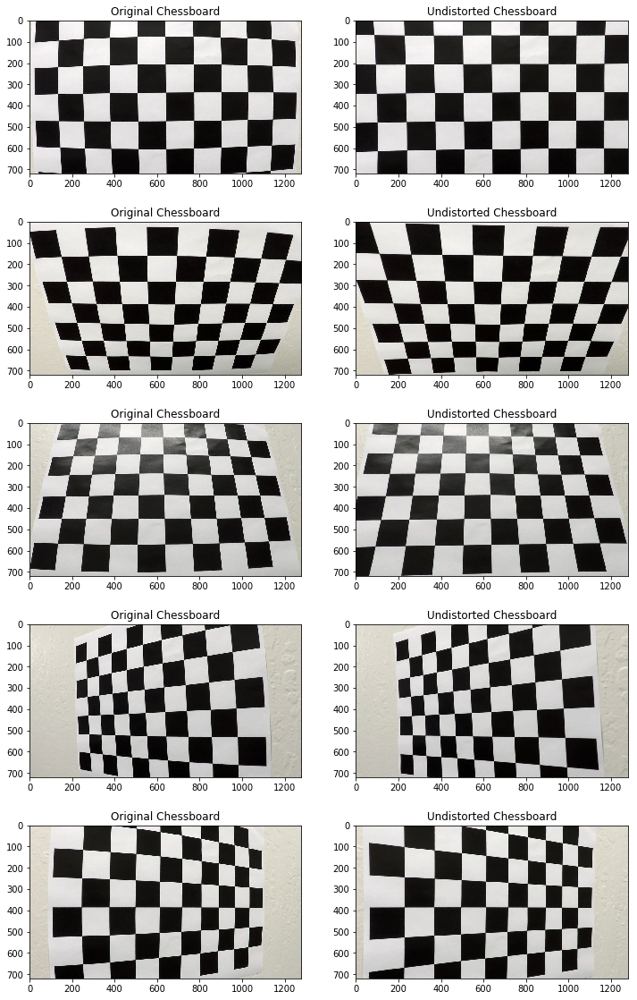

In [4]:
### Test camera calibration by visual inspection of distortion correction of a few calibration images

fig, axs = plt.subplots(5, 2, figsize=(12, 20))
axs = axs.ravel()

for i in range(5):
    image = mpimg.imread(img_names[i])
    undist_image = undistort_img(image, camera_mat, dist_coeff)
    
    axs[2*i].imshow(image)
    axs[2*i].set_title('Original Chessboard')
    axs[2*i+1].imshow(undist_image)
    axs[2*i+1].set_title('Undistorted Chessboard')
    
plt.show()

### Sample image for demonstrating steps of the pipeline

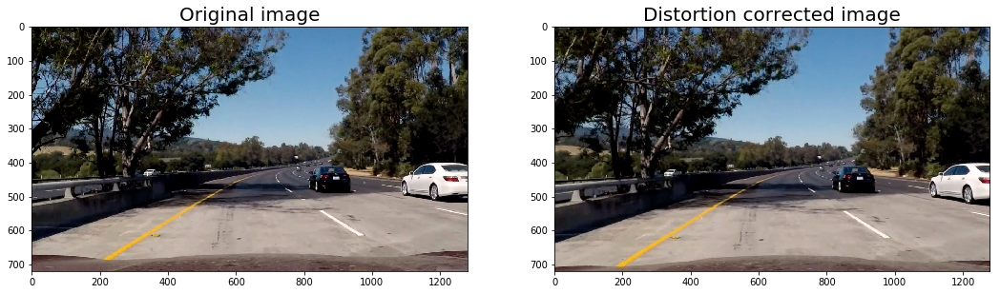

In [5]:
# img = mpimg.imread(r'.\test_images\test1.jpg')
# img = mpimg.imread(r'.\test_images\test4.jpg')
img = mpimg.imread(r'.\test_images\test5.jpg')
undist = undistort_img(img, camera_mat, dist_coeff)

fig = plt.figure(figsize = (18,8)) # create a 5 x 5 figure
axs = fig.add_subplot(121)
axs.imshow(img)
axs.set_title('Original image', fontsize=20)
axs = fig.add_subplot(122)
axs.imshow(undist)
axs.set_title('Distortion corrected image', fontsize=20)
plt.show()

### Step 3: Applying binary thresholds for detecting lane lines

### Applying Gradient thresholds
#### Absolute gradient threshold

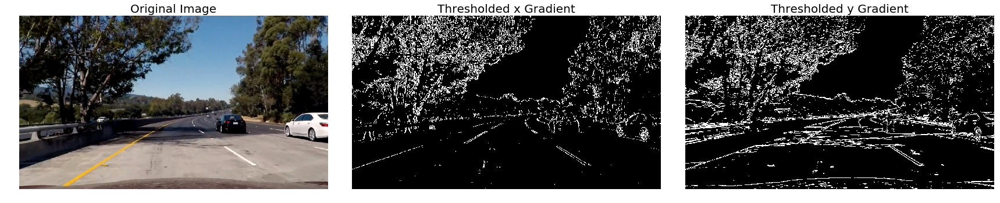

In [6]:
def abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)    # grayscale image
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel_img = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    elif orient == 'y':
        sobel_img = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        
    abs_sobel_img = np.absolute(sobel_img)
    # Scale to 8-bit then convert to type 'np.uint8'
    scaled_sobel_img = np.uint8(255*abs_sobel_img/np.max(abs_sobel_img))
    # Create a mask of 1's where the scaled gradient magnitude > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel_img)
    binary_output[(scaled_sobel_img > thresh_min) & (scaled_sobel_img < thresh_max)] = 1
    
    return binary_output
    
# Run the function
grad_binary_x = abs_sobel_thresh(undist, orient='x', thresh_min=20, thresh_max=90)
grad_binary_y = abs_sobel_thresh(undist, orient='y', thresh_min=20, thresh_max=100)

# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
f.tight_layout()
ax1.imshow(undist)
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
ax2.imshow(grad_binary_x, cmap='gray')
ax2.set_title('Thresholded x Gradient', fontsize=20)
ax2.axis('off')
ax3.imshow(grad_binary_y, cmap='gray')
ax3.set_title('Thresholded y Gradient', fontsize=20)
ax3.axis('off')
plt.show()

#### Gradient magnitude threshold

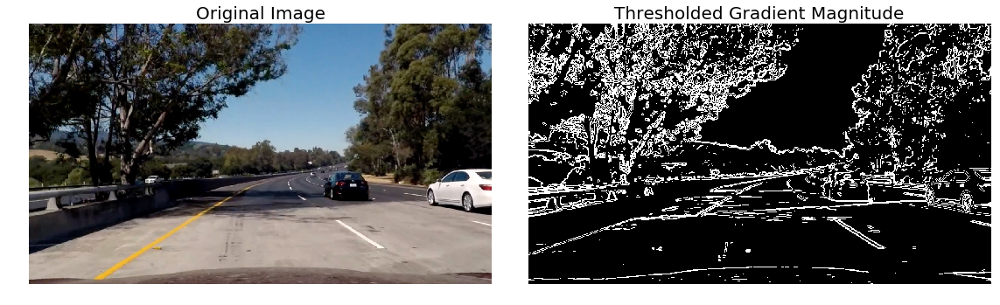

In [7]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)    # grayscale image
    # Gradient in x and y respectively
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    grad_mag = np.sqrt(np.square(sobelx) + np.square(sobely))    # Magnitude of gradient
    # Scale to 8-bit and convert to type = np.uint8
    scaled_img = np.uint8(grad_mag*255/np.max(grad_mag))
    # Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_img)
    binary_output[(scaled_img>=mag_thresh[0]) & (scaled_img<=mag_thresh[1])] = 1
    
    return binary_output
    
# Run the function
mag_binary = mag_thresh(undist, sobel_kernel=9, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
f.tight_layout()
ax1.imshow(undist)
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Gradient Magnitude', fontsize=20)
ax2.axis('off')
plt.show()

#### Gradient direction threshold

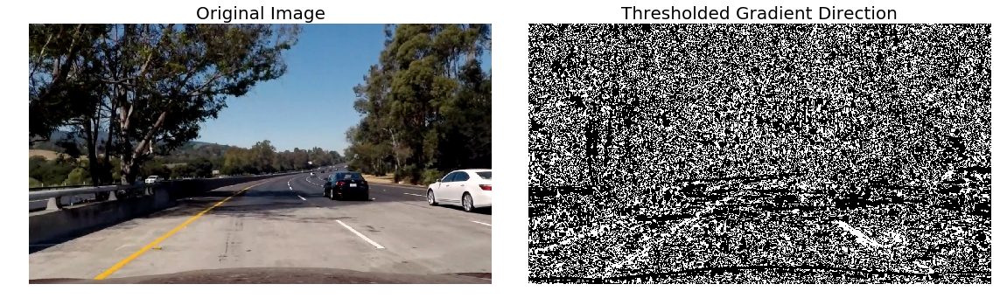

In [8]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)    # grayscale image
    # Gradient in x and y respectively
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Absolute value of the x and y gradients (Restricts angle direction to +/- pi/2 radians)
    abs_sobelx = np.absolute(sobelx); abs_sobely = np.absolute(sobely)
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)   # Direction of the gradient
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(grad_dir)
    binary_output[(grad_dir>=thresh[0]) & (grad_dir<=thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output
    
# Run the function
dir_binary = dir_threshold(undist, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
f.tight_layout()
ax1.imshow(undist)
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Gradient Direction', fontsize=20)
ax2.axis('off')
plt.show()

#### Combining various gradient based thresholds

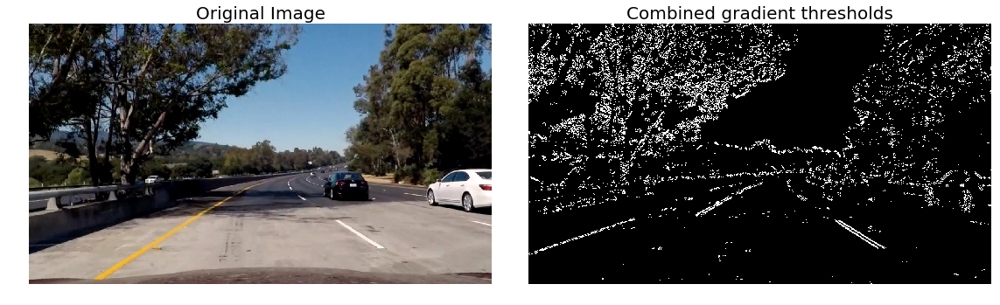

In [9]:
combo_binary = np.zeros_like(dir_binary)
combo_binary[((grad_binary_x == 1) & (grad_binary_y == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
f.tight_layout()
ax1.imshow(undist)
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
ax2.imshow(combo_binary, cmap='gray')
ax2.set_title('Combined gradient thresholds', fontsize=20)
ax2.axis('off')
plt.show()

### Applying colors thresholds

#### Visualize different colorspace channels

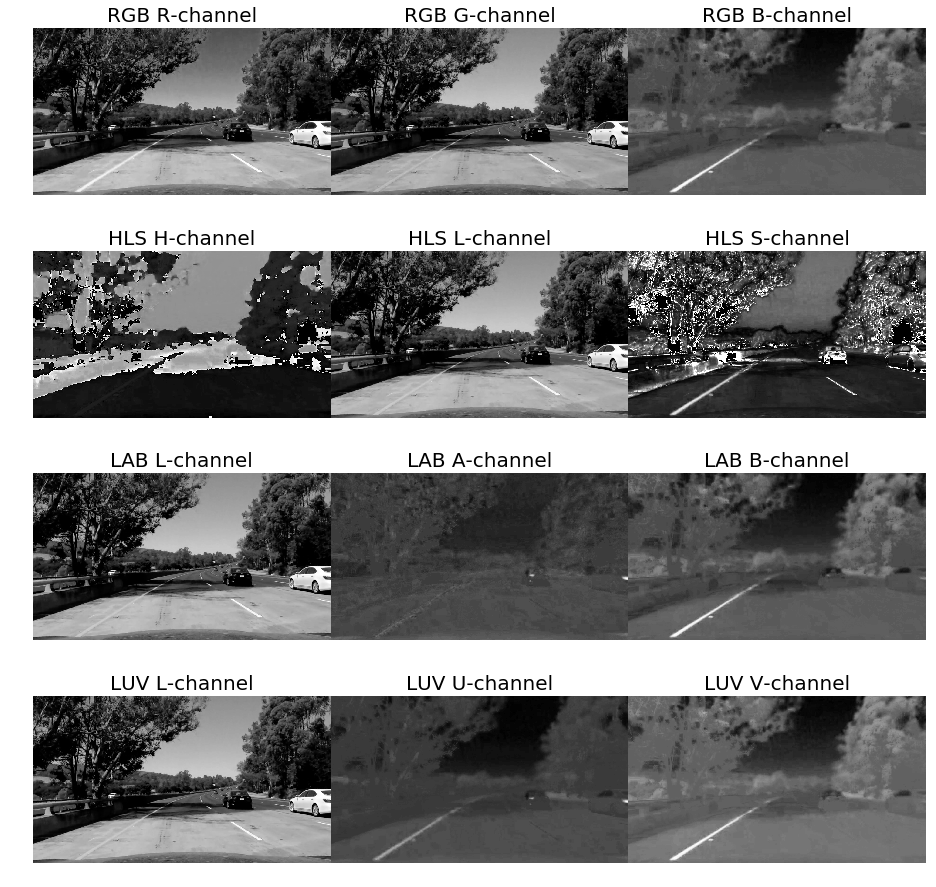

In [10]:
img_dist_RGB = undist
img_dist_R, img_dist_G, img_dist_B = cv2.split(img_dist_RGB)

img_dist_HLS = cv2.cvtColor(img_dist_RGB, cv2.COLOR_RGB2HLS)
img_dist_H, img_dist_L, img_dist_S = cv2.split(img_dist_HLS)

img_dist_LAB = cv2.cvtColor(img_dist_RGB, cv2.COLOR_RGB2Lab)
img_dist_L, img_dist_A, img_dist_B = cv2.split(img_dist_LAB)

img_dist_LUV = cv2.cvtColor(img_dist_RGB, cv2.COLOR_RGB2Luv)
img_dist_L, img_dist_U, img_dist_V = cv2.split(img_dist_LUV)

figs = [img_dist_R, img_dist_G, img_dist_B, img_dist_H, img_dist_L, img_dist_S,
       img_dist_L, img_dist_A, img_dist_B, img_dist_L, img_dist_U, img_dist_V]
fig_titles = ["RGB R-channel", "RGB G-channel", "RGB B-channel", "HLS H-channel", "HLS L-channel", "HLS S-channel", 
              "LAB L-channel", "LAB A-channel", "LAB B-channel", "LUV L-channel", "LUV U-channel", "LUV V-channel"]

fig, axs = plt.subplots(4,3, figsize=(16, 16))
fig.subplots_adjust(hspace = .1, wspace=.001)
axs = axs.ravel()

for i in range(len(figs)):
    axs[i].imshow(figs[i], cmap = 'gray')
    axs[i].set_title(fig_titles[i], fontsize=20)
    axs[i].axis('off')
plt.show()

#### Choosing color channels for detecting yellow lanes

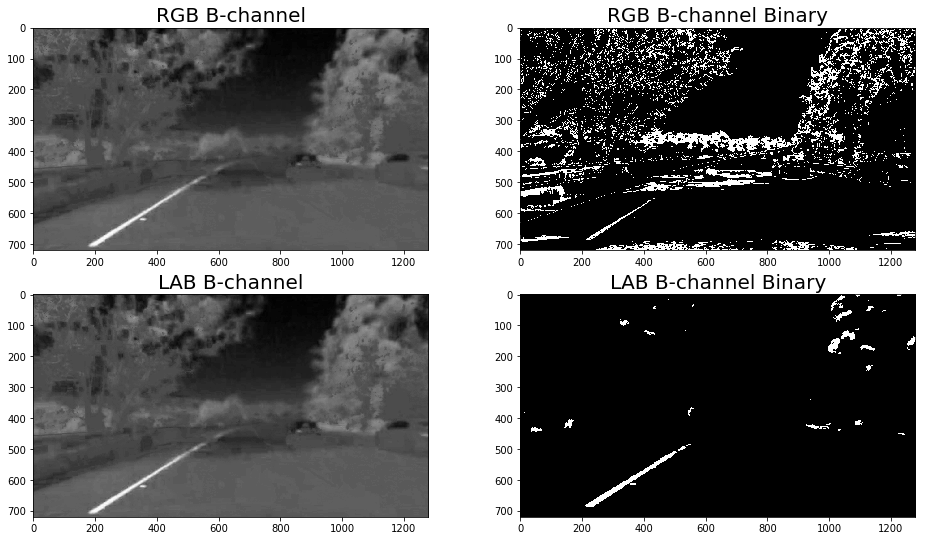

In [11]:
def yellow_lane_binary(img, thresh=(40, 70), color_space="RGB"):
    if color_space == "LAB":
        img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)    # LAB image
        color_channel = img_lab[:,:,2]                    # B channel
    else:
        color_channel = img[:,:,2]                        # RGB image, B channel
    # Apply a threshold to the color channel of LAB/RGB image
    binary_yellow = np.zeros_like(color_channel)
    binary_yellow[(color_channel >= thresh[0]) & (color_channel <= thresh[1])] = 1
    return binary_yellow

# Run the function
binary_rgb_b = yellow_lane_binary(img)
binary_lab_b = yellow_lane_binary(img, thresh=(150, 255), color_space="LAB")

# Plot results
fig, axs = plt.subplots(2, 2, figsize=(16, 9))
axs = axs.ravel()
axs[0].imshow(figs[2], cmap = 'gray')
axs[0].set_title(fig_titles[2], fontsize=20)
axs[1].imshow(binary_rgb_b, cmap = 'gray')
axs[1].set_title(fig_titles[2]+" Binary", fontsize=20)
axs[2].imshow(figs[8], cmap = 'gray')
axs[2].set_title(fig_titles[8], fontsize=20)
axs[3].imshow(binary_lab_b, cmap = 'gray')
axs[3].set_title(fig_titles[8]+" Binary", fontsize=20)
plt.show()

#### Choosing color channels for detecting white lanes

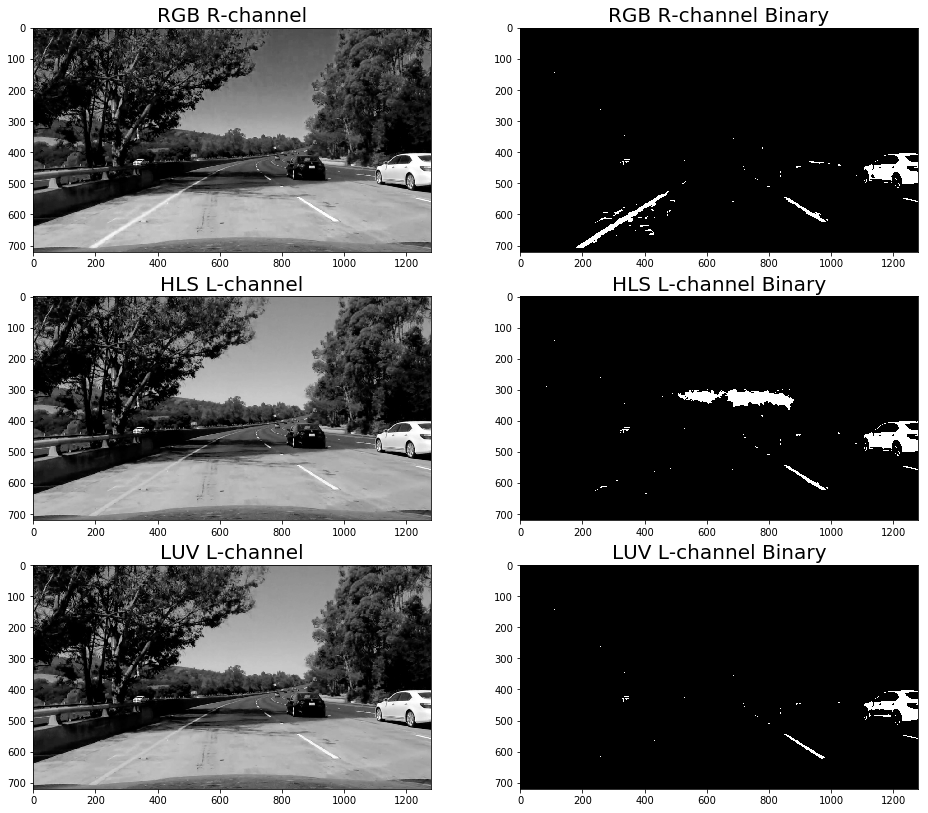

In [12]:
def white_lane_binary(img, thresh=(180, 255), color_space="RGB"):
    if color_space == "HLS":
        img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)    # HLS image
        color_channel = img_hls[:, :, 1]                  # L channel
    elif color_space == "LUV":
        img_luv = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)    # LUV image
        color_channel = img_luv[:, :, 0]                  # L channel
    else:
        color_channel = img[:, :, 0]                      # RGB image, R channel
    # Apply a threshold to the color channel of HLS/LUV/RGB image
    binary_white = np.zeros_like(color_channel)
    binary_white[(color_channel >= thresh[0]) & (color_channel <= thresh[1])] = 1
    return binary_white

# Run the function
binary_rgb_r = white_lane_binary(undist, thresh=(200, 255))
binary_hls_l = white_lane_binary(undist, thresh=(190, 255), color_space="HLS")
binary_luv_l = white_lane_binary(undist, thresh=(210, 255), color_space="LUV")

# Plot results
fig, axs = plt.subplots(3, 2, figsize=(16, 14))
axs = axs.ravel()
axs[0].imshow(figs[0], cmap = 'gray')
axs[0].set_title(fig_titles[0], fontsize=20)
axs[1].imshow(binary_rgb_r, cmap = 'gray')
axs[1].set_title(fig_titles[0]+" Binary", fontsize=20)
axs[2].imshow(figs[4], cmap = 'gray')
axs[2].set_title(fig_titles[4], fontsize=20)
axs[3].imshow(binary_hls_l, cmap = 'gray')
axs[3].set_title(fig_titles[4]+" Binary", fontsize=20)
axs[4].imshow(figs[9], cmap = 'gray')
axs[4].set_title(fig_titles[9], fontsize=20)
axs[5].imshow(binary_luv_l, cmap = 'gray')
axs[5].set_title(fig_titles[9]+" Binary", fontsize=20)
plt.show()

### Color + gradient thresholds

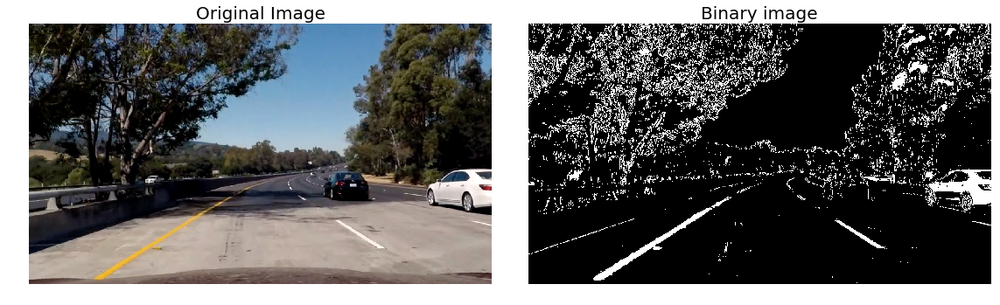

In [13]:
def binary_thresholding(img, b_thresh = (150, 255), l_thresh = (210, 255), grad_thresh = (20, 75)):
    # Using B channel of 'LAB' colorspace to detect yellow lanes
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)    # LAB image
    B = img_lab[:,:,2]                                # B channel
    binary_yellow = np.zeros_like(B)
    binary_yellow[(B >= b_thresh[0]) & (B <= b_thresh[1])] = 1
    
    # Using L channel of 'LUV' colorspace to detect white lanes
    img_luv = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)    # LUV image
    L = img_luv[:,:,0]                                # L channel
    binary_white = np.zeros_like(L)
    binary_white[(L >= l_thresh[0]) & (L <= l_thresh[1])] = 1
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)      # grayscale image
    sobel_img = cv2.Sobel(gray, cv2.CV_64F, 1, 0)     # x gradient    
    abs_sobel_img = np.absolute(sobel_img)
    # Scale to 8-bit then convert to type 'np.uint8'
    scaled_sobel_img = np.uint8(255*abs_sobel_img/np.max(abs_sobel_img))
    grad_binary = np.zeros_like(scaled_sobel_img)
    grad_binary[(scaled_sobel_img > grad_thresh[0]) & (scaled_sobel_img < grad_thresh[1])] = 1
    
    combined_binary = np.zeros_like(grad_binary)
    combined_binary[(binary_yellow == 1) | (binary_white == 1) | (grad_binary == 1)] = 1
    
    return combined_binary

# Run the function
final_binary = binary_thresholding(undist)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
f.tight_layout()
ax1.imshow(undist)
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
ax2.imshow(final_binary, cmap='gray')
ax2.set_title('Binary image', fontsize=20)
ax2.axis('off')
plt.show()

### Step 4: Warp image to get the desired perspective (bird's-eye view)

In [14]:
def warp_img(img, src, dst):   
    img_size = (img.shape[1], img.shape[0])

    M = cv2.getPerspectiveTransform(src, dst)            # Transformation matrix
    Minv = cv2.getPerspectiveTransform(dst, src)         # Inverse transformation matrix
    warped = cv2.warpPerspective(img, M, img_size)    # Warping image to get bird's eye view
    return warped, M, Minv

#### Visualizing image warp

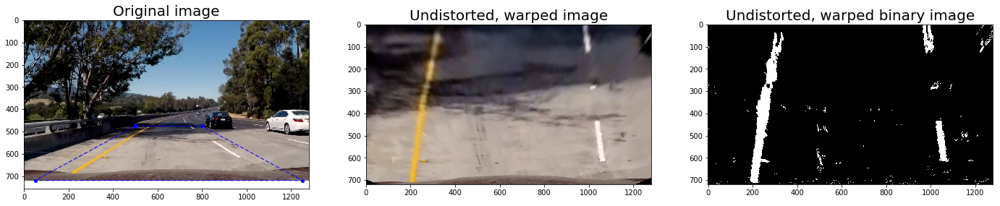

In [15]:
h,w = undist.shape[:2]

# src_pts2 = np.float32([[490, 482],[810, 482], [1250, 720],[40, 720]])
src_pts = np.float32([[500, 475],[800, 475], [1250, h],[50, h]])
dst_pts = np.float32([[100, 0], [w-100, 0], [w-100, h],[100, h]])

img_warped, persp_M, M_inv  = warp_img(undist, src_pts, dst_pts)
img_warped_binary = binary_thresholding(img_warped)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24,8))
ax1.imshow(img)
ax1.set_title('Original image', fontsize=20)
x = [src_pts[0][0],src_pts[1][0],src_pts[2][0],src_pts[3][0],src_pts[0][0]]
y = [src_pts[0][1],src_pts[1][1],src_pts[2][1],src_pts[3][1],src_pts[0][1]]
# x2 = [src_pts2[0][0],src_pts2[1][0],src_pts2[2][0],src_pts2[3][0],src_pts2[0][0]]
# y2 = [src_pts2[0][1],src_pts2[1][1],src_pts2[2][1],src_pts2[3][1],src_pts2[0][1]]
ax1.plot(x, y, color='blue', marker='o', linestyle='dashed', linewidth=1, markersize=4)
# ax1.plot(x2, y2, color='red', marker='o', linestyle='dashed', linewidth=1, markersize=4)
ax2.imshow(img_warped)
ax2.set_title('Undistorted, warped image', fontsize=20)
ax3.imshow(img_warped_binary, cmap = 'gray')
ax3.set_title('Undistorted, warped binary image', fontsize=20)
plt.show()

### Defining image processing pipeline

In [16]:
def processing_img(img, mtx=camera_mat, dist=dist_coeff, srcpts = src_pts, dstpts = dst_pts):
    undist_img = undistort_img(img, mtx, dist)
    warped_img, persp_M, M_inv  = warp_img(undist_img, srcpts, dstpts)
    binary_warped = binary_thresholding(warped_img)
    return binary_warped, M_inv

### Running current pipeline on all Test images

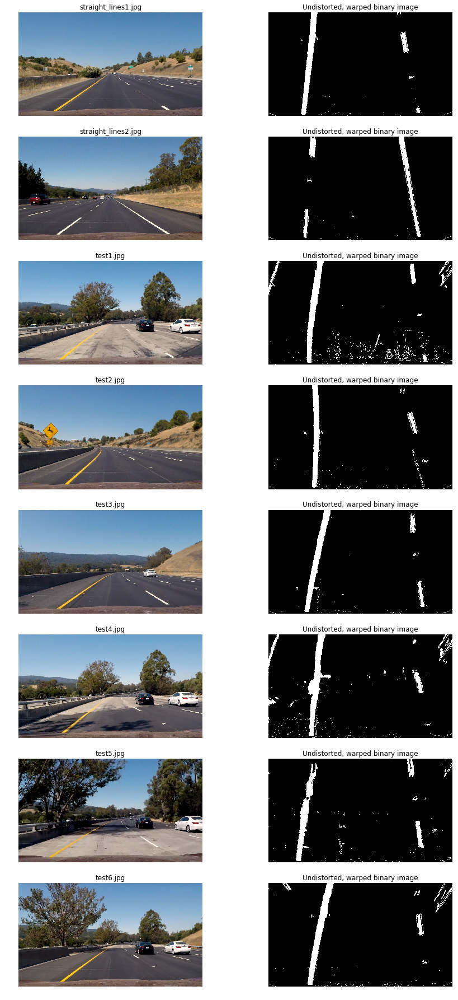

In [17]:
test_images = glob.glob(r'.\test_images\*.jpg')
# Plot the results
fig, axs = plt.subplots(len(test_images),2, figsize=(16, 32))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for img_name in test_images:
    image = mpimg.imread(img_name)
    warped_img_binary, Minv = processing_img(image)
    axs[i].imshow(image)
    axs[i].set_title(img_name.split('\\')[-1])
    axs[i].axis('off')
    i += 1
    axs[i].imshow(warped_img_binary, cmap='gray')
    axs[i].set_title("Undistorted, warped binary image")
    axs[i].axis('off')
    i += 1
    
plt.show()

### Step 5: Identify lane pixels and lane boundaries
#### Locate start of lane lines using histogram peaks

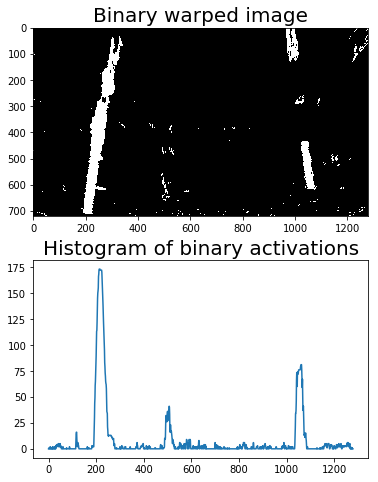

In [18]:
def hist(img):
    # Searching for start of lane lines in bottom quarter of image
    # Sum across image pixels vertically- highest areas of vertical lines should be larger values
    hist_img = np.sum(img[img.shape[0]*3//4:,:], axis=0)
    return hist_img

# Create histogram of image binary activations
histogram = hist(img_warped_binary)
# Visualize the resulting histogram
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,8))
ax1.imshow(img_warped_binary, cmap = 'gray')
ax1.set_title('Binary warped image', fontsize=20)
ax2.plot(histogram)
ax2.set_title('Histogram of binary activations', fontsize=20)
plt.show()

### Fit polynomial to lane lines (Sliding window approach)

In [19]:
def lanes_polyfit(bin_img, bbox_visualize=False):
    # Histogram of binary activations (bottom half of image)
    histogram = hist(bin_img)
    
    # Starting points for the left and right lanes (peaks in the histogram)
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    nwindows = 9    # Number of sliding windows
    margin = 80      # Width of the windows +/- margin
    minpix = 40      # Minimum number of pixels found to recenter window

    # Calculate window height
    window_height = bin_img.shape[0]//nwindows
    
    # x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Create empty list to store coordinates of bounding boxes around lane lines (for visualization)
    bboxes = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = bin_img.shape[0] - (window+1)*window_height
        win_y_high = bin_img.shape[0] - window*window_height
        
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
                    
        bboxes.append([win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high])
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # Recenter next window on the new mean position if minpix condition is met
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each lane line
    left_fit, right_fit = (None, None)
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    left_fitx, right_fitx = polyfit(bin_img.shape, left_fit, right_fit)

    if bbox_visualize:
        return leftx, lefty, rightx, righty, left_fitx, right_fitx, bboxes
    return leftx, lefty, rightx, righty, left_fit, right_fit

In [20]:
def polyfit(img_shape, left_fit, right_fit):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    # Calculate both polynomials using ploty, left_fit and right_fit
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
            
    return left_fitx, right_fitx

#### Visualizing sliding windows around lane lines

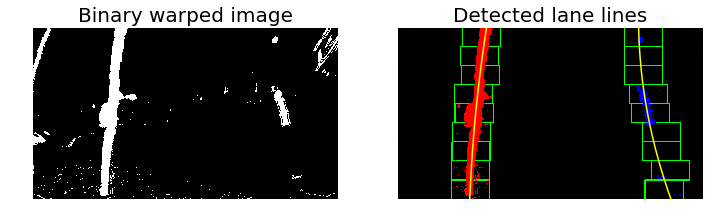

In [21]:
def lanes_visualization(img):
    binary, _ = processing_img(img)
    
    # Create an output image to draw on and  visualize the result
    disp_img = np.uint8(np.dstack((binary, binary, binary)))           # Visualization image
    
    left_x, left_y, right_x, right_y, left_fit_x, right_fit_x, bounding_boxes = lanes_polyfit(binary, bbox_visualize=True)
    plot_y = np.linspace(0, binary.shape[0]-1, binary.shape[0])
    
    # Draw the windows on the visualization image
    for bbox in bounding_boxes:
        cv2.rectangle(disp_img,(bbox[2],bbox[0]),(bbox[3],bbox[1]),(0,255,0), 3) 
        cv2.rectangle(disp_img,(bbox[4],bbox[0]),(bbox[5],bbox[1]),(0,255,0), 3)
        
    # Colors in the left and right lane regions
    disp_img[left_y, left_x] = [255, 0, 0]
    disp_img[right_y, right_x] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fit_x, plot_y, color='yellow')
    plt.plot(right_fit_x, plot_y, color='yellow')
    
    return disp_img

test_img_name = r'.\test_images\test4.jpg'
test_img = mpimg.imread(test_img_name)
test_binary, _ = processing_img(test_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
ax1.imshow(test_binary, cmap = 'gray')
ax1.set_title('Binary warped image', fontsize=20)
ax1.axis('off')
ax2.imshow(lanes_visualization(test_img))
ax2.set_title('Detected lane lines', fontsize=20)
ax2.axis('off')
plt.show()

### Fit polynomial to lane lines using fit from previous frame

In [22]:
# Method to fit polynomial to lane lines in binary image leveraging knowledge of a fit from a previous frame
# with underlying assumption that the fit will not change significantly from one video frame to the next
def search_lane_prev_fit(bin_img, l_fit_prev, r_fit_prev):
    # HYPERPARAMETER: Width of the margin around the previous polynomial to search
    margin = 100
    
    # Grab activated pixels
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the area of search based on activated x-values within the +/- margin of our polynomial function
    left_lane_inds = ((nonzerox >= (l_fit_prev[0]*(nonzeroy**2) + l_fit_prev[1]*nonzeroy + l_fit_prev[2] - margin)) & 
                      (nonzerox < (l_fit_prev[0]*(nonzeroy**2) + l_fit_prev[1]*nonzeroy + l_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox >= (r_fit_prev[0]*(nonzeroy**2) + r_fit_prev[1]*nonzeroy + r_fit_prev[2] - margin)) & 
                       (nonzerox < (r_fit_prev[0]*(nonzeroy**2) + r_fit_prev[1]*nonzeroy + r_fit_prev[2] + margin)))  

    # Extract left and right line pixel positions again
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a new second order polynomial to each lane line
    (l_fit_new, r_fit_new) = (None, None)
    if len(leftx) != 0:
        l_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        r_fit_new = np.polyfit(righty, rightx, 2)
    
    return leftx, lefty, rightx, righty, l_fit_new, r_fit_new
# left_lane_inds, right_lane_inds

#### Visualizing lane lines polynomial search using previous fit

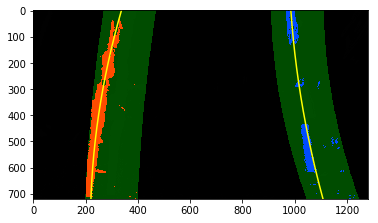

In [23]:
## Visualization using test images test4.jpg & test5.jpg which appear to be consecutive frames
test_img = mpimg.imread('./test_images/test4.jpg')
test_img_bin, _ = processing_img(test_img)
left_x, left_y, right_x, right_y, left_fit, right_fit = lanes_polyfit(test_img_bin)
    
test_img2 = mpimg.imread('./test_images/test5.jpg')
test_img2_bin, _ = processing_img(test_img2)
left_x2, left_y2, right_x2, right_y2, left_fit2, right_fit2 = search_lane_prev_fit(test_img2_bin, left_fit, right_fit)

# HYPERPARAMETER: Width of the margin around the previous polynomial to search
margin = 100

# Generate x and y values for plotting
ploty = np.linspace(0, test_img_bin.shape[0]-1, test_img_bin.shape[0])

left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((test_img_bin, test_img_bin, test_img_bin)))
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
out_img[left_y2, left_x2] = [255, 0, 0]
out_img[right_y2, right_x2] = [0, 0, 255]

# Generate a polygon to illustrate the search window area using old fit
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))

right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

# Plot the polynomial lines onto the image
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')

# View your output
plt.imshow(result)
plt.show()

### Step 6: Estimate lane curvature and distance from lane center

In [24]:
def measure_curvature_centerdist(img_shape, left_fit, right_fit, leftx, lefty, rightx, righty):
    """
    Calculates the curvature of polynomial functions in pixels.
    """
    scale_ym = 30./720 # meters per pixel in y dimension
    scale_xm = 3.7/700 # meters per pixel in x dimension
    l_radius, r_radius, center_dist = (0,0,0)
    
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*scale_ym, leftx*scale_xm, 2)
        right_fit_cr = np.polyfit(righty*scale_ym, rightx*scale_xm, 2)

        # Calculation of the new radii of curvature
        l_radius = ((1 + (2*left_fit_cr[0]*y_eval*scale_ym + left_fit_cr[1])**2)**(3/2.))/abs(2*left_fit_cr[0])
        r_radius = ((1+(2*right_fit_cr[0]*y_eval*scale_ym + right_fit_cr[1])**2 )**(3/2.))/abs(2*right_fit_cr[0])
        
    # Distance from center is = (image x-midpoint) - (mean of l_fit and r_fit intercepts)
    if left_fit is not None and right_fit is not None:
        car_loc = img_shape[1]/2
        left_fitx = left_fit[0]*img_shape[0]**2 + left_fit[1]*img_shape[0] + left_fit[2]
        right_fitx = right_fit[0]*img_shape[0]**2 + right_fit[1]*img_shape[0] + right_fit[2]
        lane_center_loc = (left_fitx + right_fitx)/2.
        center_dist = (car_loc - lane_center_loc) * scale_xm
    return l_radius, r_radius, center_dist

In [25]:
left_radius, right_radius, center_dist = \
measure_curvature_centerdist(test_img_bin.shape, left_fit, right_fit, left_x, left_y, right_x, right_y)

print('Radius of curvature for example:', round(left_radius,2), 'm,', round(right_radius,2), 'm')
print('Distance from lane center for example:', round(center_dist,3), 'm')

Radius of curvature for example: 2023.33 m, 703.86 m
Distance from lane center for example: -0.438 m


### Step 7: Project detected lane lines back onto Origial image

In [26]:
def cast_lane(og_img, bin_img, l_fit, r_fit, Minv):
    
    if l_fit is None or r_fit is None:
        return og_img
    
    # Create an image to draw the lines on
    bin_warp = np.zeros(bin_img.shape, dtype=np.uint8)
    color_warp = np.dstack((bin_warp, bin_warp, bin_warp))
    
    h,w = bin_img.shape
    ploty = np.linspace(0, h-1, h)
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    unwarped_img = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(og_img, 1, unwarped_img, 0.5, 0)
    return result

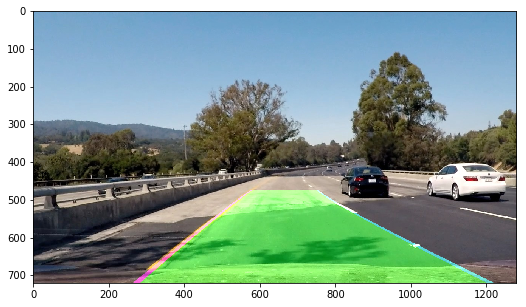

In [27]:
## Visualization using test images test4.jpg
test_img = mpimg.imread('./test_images/test4.jpg')
test_img_bin, M_inv = processing_img(test_img)
left_x, left_y, right_x, right_y, lfit, rfit = lanes_polyfit(test_img_bin)
out_img = cast_lane(test_img, test_img_bin, lfit, rfit, M_inv)

plt.figure(figsize=(10,5))
plt.imshow(out_img)
plt.show()

### Step 8: Display estimated lane curvature and vehicle position

In [28]:
def draw_data(og_img, curv_rad, center_dist):
    new_img = np.copy(og_img)

    text = 'Curve radius: ' + str(round(curv_rad, 2)) + '(m)'
    cv2.putText(new_img, text, (50,75), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
    direction = 'right' if center_dist > 0 else 'left' if center_dist < 0 else ''
    text = str(round(abs(center_dist), 3)) + '(m) ' + direction + ' of center'
    cv2.putText(new_img, text, (50,120), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
    return new_img

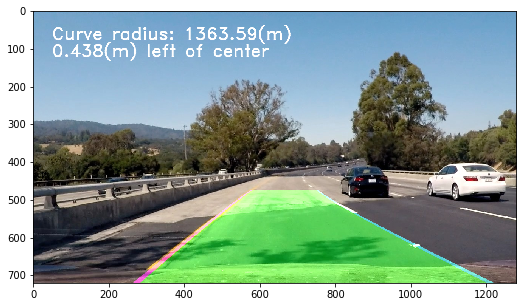

In [29]:
## Visualization using test images test4.jpg
left_x, left_y, right_x, right_y, lfit, rfit = lanes_polyfit(test_img_bin)
l_rad, r_rad, cdist = measure_curvature_centerdist(test_img_bin.shape, lfit, rfit, left_x, left_y, right_x, right_y)

out_img = cast_lane(test_img, test_img_bin, lfit, rfit, M_inv)
out_img2 = draw_data(out_img, (l_rad+r_rad)/2, cdist)

plt.figure(figsize=(10,5))
plt.imshow(out_img2)
plt.show()

### Define a class for storing lane lines data

In [30]:
# Define a class to store the attributes of each lane detection
class Line():
    def __init__(self):
        self.detected = False       # Lane detected in the last iteration
        
        self.recent_xfitted = []    # x values of the last n fits of the line
        self.bestx = None           # Running avg. of x values of fitted lines over last n iterations
        
        self.best_fit = None        # Polynomial coefficients averaged over last n iterations
        self.current_fit = []       # Polynomial coefficients for the most recent fit
        
        # Diff. in polynomial coefficients between last and new fits
        self.diffs = np.zeros((3,), dtype=np.float)
        
        self.radius = None          # Store radius of curvature in meters
        self.vehicle_pos = None     # Distance in meters of vehicle center from the lane center
        
    def add_polyfit(self, new_fit): # May need to change 'inds' in signature
        """
        Check legitimacy/validity of a found fit by capping the difference in
        fit with respect to a previous fit and append it to the list of fits for the lane lines
        """
        if new_fit is not None:
            if self.best_fit is not None:
                self.diffs = abs(new_fit-self.best_fit)
            # Specify condition for a "bad" fit
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit)>0:
                self.detected = False
            else:
                self.detected = True
                self.current_fit.append(new_fit)
                # Discards old fits, keep most recent n (P.S.- Here, I've taken n = 5)
                if len(self.current_fit) > 5:
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        else:
            self.detected = False
            # Discards oldest fit
            if len(self.current_fit) > 0:
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
                self.best_fit = np.average(self.current_fit, axis=0)

### Define video processing pipeline

In [42]:
def process_pipeline(img):
    new_img = np.copy(img)
    img_binary, M_inv = processing_img(new_img)
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_lane.detected or not r_lane.detected:
        left_x, left_y, right_x, right_y, lfit, rfit = lanes_polyfit(img_binary)
    else:
        left_x, left_y, right_x, right_y, lfit, rfit = search_lane_prev_fit(img_binary, l_lane.best_fit, r_lane.best_fit)
        
    # Discard both fits if the difference in their x-intercepts (lane width) is unusually large or small
#     if lfit is not None and rfit is not None:
#         h = img.shape[0]
#         l_fit_x = lfit[0]*h**2 + lfit[1]*h + lfit[2]
#         r_fit_x = rfit[0]*h**2 + rfit[1]*h + rfit[2]
#         x_lanes_diff = abs(r_fit_x-l_fit_x)
#         if abs(350 - x_lanes_diff) > 100:
#             lfit = None
#             rfit = None
            
    l_lane.add_polyfit(lfit)
    r_lane.add_polyfit(rfit)
    
    # draw the current best fit if it exists
    if l_lane.best_fit is not None and r_lane.best_fit is not None:
        l_rad, r_rad, cdist = measure_curvature_centerdist(img_binary.shape, lfit, rfit, left_x, left_y, right_x, right_y)

        out_img_1 = cast_lane(new_img, img_binary, lfit, rfit, M_inv)
        out_img = draw_data(out_img_1, (l_rad+r_rad)/2, cdist)
    else:
        out_img = new_img

    return out_img

In [43]:
from moviepy.editor import VideoFileClip

l_lane = Line()
r_lane = Line()

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')#.subclip(0,16)
processed_video = video_input1.fl_image(process_pipeline)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [03:00<00:00,  6.97it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 3min 1s


In [44]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('project_video_output.mp4'))